# Práctica de Sistemas Recomendadores: pyreclab - Funk's SVD

En este práctico implementaremos un recomendador basado en un algoritmo de factorización matricial propuesto por [Simon Funk](https://sifter.org/simon/journal/20061211.html).

Volveremos a utilizar la biblioteca de Python [pyreclab](https://github.com/gasevi/pyreclab), desarrollado por los Laboratorios IALab y SocVis de la Pontificia Universidad Católica de Chile.

**Adaptado por**: Vladimir Araujo

**Material original de**: Denis Parra, Gabriel Sepúlveda, Antonio Ossa, Manuel Cartagena


## Configuración inicial

**Paso 1:** Descargue directamente a Colab los archivos del dataset ejecutando las siguientes 3 celdas:

In [22]:
!curl -L -o "u2.base" "https://drive.google.com/uc?export=download&id=1bGweNw7NbOHoJz11v6ld7ymLR8MLvBsA"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   388    0   388    0     0    231      0 --:--:--  0:00:01 --:--:--   231
100 1546k  100 1546k    0     0   823k      0  0:00:01  0:00:01 --:--:--  823k


In [23]:
!curl -L -o "u2.test" "https://drive.google.com/uc?export=download&id=1f_HwJWC_1HFzgAjKAWKwkuxgjkhkXrVg"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   388    0   388    0     0    432      0 --:--:-- --:--:-- --:--:--   431
100  385k  100  385k    0     0   366k      0  0:00:01  0:00:01 --:--:--  366k


In [24]:
!curl -L -o "u.item" "https://drive.google.com/uc?export=download&id=10YLhxkO2-M_flQtyo9OYV4nT9IvSESuz"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   388    0   388    0     0    626      0 --:--:-- --:--:-- --:--:--   626
100  230k  100  230k    0     0   309k      0 --:--:-- --:--:-- --:--:--  309k


**Paso 2**: Instalamos [`pyreclab`](https://github.com/gasevi/pyreclab) y [`seaborn`](https://seaborn.pydata.org/index.html) utilizando `pip`.

In [25]:
!pip install pyreclab --upgrade
#!pip install seaborn --upgrade

In [26]:
import pandas as pd
import pyreclab
import seaborn as sns
import numpy as np
import scipy.sparse as sparse
import matplotlib.pyplot as plt

%matplotlib inline
sns.set(style="whitegrid")

## Antes de recomendar

**Paso 3**: Los archivos `u2.base` y `u2.test` tienen tuplas (usuario, item, rating, timestamp), que es la información de preferencias de usuarios sobre películas en una muestra del dataset [MovieLens](https://grouplens.org/datasets/movielens/). Revisemos cómo es uno de estos archivos y luego haremos gráficos que nos permitan sacar conclusiones a partir del mismo.

In [27]:
# Primero creamos el dataframe con los datos
df_train = pd.read_csv('u2.base',
                         sep='\t',
                         names=['userid', 'itemid', 'rating', 'timestamp'],
                         header=None)
df_train.head()

,userid,itemid,rating,timestamp
0,1,3,4,878542960
1,1,4,3,876893119
2,1,5,3,889751712
3,1,6,5,887431973
4,1,7,4,875071561


In [28]:
# Ahora queremos realizar una observación rápida de los datos
df_train.describe()

,userid,itemid,rating,timestamp
count,80000.000000,80000.000000,80000.000000,8.000000e+04
mean,494.508137,424.990487,3.526463,8.835467e+08
std,276.879511,330.564093,1.124429,5.379549e+06
min,1.000000,1.000000,1.000000,8.747247e+08
25%,269.000000,174.000000,3.000000,8.794471e+08
50%,500.000000,321.000000,4.000000,8.828278e+08
75%,744.000000,630.000000,4.000000,8.884652e+08
max,943.000000,1682.000000,5.000000,8.932866e+08


Por otra parte, para obtener información adicional de cada película tal como **título**, **fecha de lanzamiento**, **género**, etc., cargaremos el archivo de items descargado (`u.item`) para poder mapear cada identificador de ítem al conjunto de datos que lo describe. Revisemos el contenido de este archivo

In [29]:
columns = ['movieid', 'title', 'release_date', 'video_release_date', \
           'IMDb_URL', 'unknown', 'Action', 'Adventure', 'Animation', \
           'Children', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Fantasy', \
           'Film-Noir', 'Horror', 'Musical', 'Mystery', 'Romance', 'Sci-Fi', \
           'Thriller', 'War', 'Western']

In [30]:
# Cargamos el dataset con los items
df_items = pd.read_csv('u.item',
                        sep='|',
                        index_col=0,
                        names = columns,
                        header=None, 
                        encoding='latin-1')
df_items.head()

,title,release_date,video_release_date,IMDb_URL,unknown,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
movieid,,,,,,,,,,,,,,,,,,,,,,,
1,Toy Story (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Toy%20Story%2...,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,GoldenEye (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?GoldenEye%20(...,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,Four Rooms (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Four%20Rooms%...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,Get Shorty (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Get%20Shorty%...,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
5,Copycat (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Copycat%20(1995),0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0


In [31]:
# Realizamos una inspección sobre estos datos (.info())
df_items.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1682 entries, 1 to 1682
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   title               1682 non-null   object 
 1   release_date        1681 non-null   object 
 2   video_release_date  0 non-null      float64
 3   IMDb_URL            1679 non-null   object 
 4   unknown             1682 non-null   int64  
 5   Action              1682 non-null   int64  
 6   Adventure           1682 non-null   int64  
 7   Animation           1682 non-null   int64  
 8   Children            1682 non-null   int64  
 9   Comedy              1682 non-null   int64  
 10  Crime               1682 non-null   int64  
 11  Documentary         1682 non-null   int64  
 12  Drama               1682 non-null   int64  
 13  Fantasy             1682 non-null   int64  
 14  Film-Noir           1682 non-null   int64  
 15  Horror              1682 non-null   int64  
 16  Musica

In [32]:
# Ejemplo de cómo visualizar titulos de peliculas en base a sus IDs
pelis = [5,4,1]
df_items.loc[pelis]['title']

movieid
5       Copycat (1995)
4    Get Shorty (1995)
1     Toy Story (1995)
Name: title, dtype: object

**Paso 4:** Generemos algunos gráficos en relación a las películas.

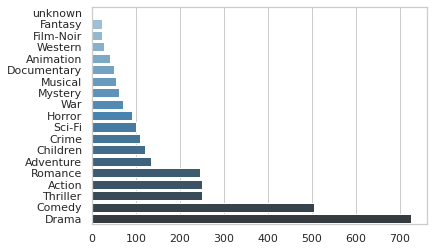

In [33]:
#Ignorar el warning
genre_columns = ['unknown', 'Action', 'Adventure', 'Animation', \
           'Children', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Fantasy', \
           'Film-Noir', 'Horror', 'Musical', 'Mystery', 'Romance', 'Sci-Fi', \
           'Thriller', 'War', 'Western']

genre_count = df_items[genre_columns].sum().sort_values()

sns.barplot(x=genre_count.values, y=genre_count.index, label="Total", palette="Blues_d")

Antes de trabajar con SVD, responda las siguientes preguntas.

**Pregunta:** Explique cómo funciona SVD (como modelo, no piense en la implementación), y cómo funciona el método `train()` en  `pyreclab`





**Respuesta:**

La descomposicion singula de valores (SVD), es una tecnica de factorizacion de matrices que descompone una matriz A de dimensiones m x n, en el producto de matrices de la siguiente forma:

$$SVD(A) = U x S x V^t$$

Las matrices U y V son ortogonales, donde U tiene dimensiones  n x n y V dimensiones de m x m. La matriz S tiene las mismas dimensiones de A y esta tiene un su diagonal los valores singulares ordenados de mayor a menor.

El metodo train() de pyreclab aplica SVD a la matriz A que representa las valoraciones de los usuarios para los diferentes items, al aplicar el algoritmo se calcula la matriz S para calcular los valores singulares y luego se reduce la cantidad de valores a los primeros j. De esta forma se logra representar esta gran cantidad de informacion de forma mucho mas reducida en la matriz S.



## SVD

**Paso 5**: Tome un usuario, cualquiera, del dataset y reporte parte de sus gustos explícitamente (es decir, nombre de las películas, género, etc., no id). Para este mismo usuario, revise explícitamente las recomendaciones al llegar a la parametrización que reporta las mejores métricas.

In [34]:
user_id = 8
user_df = df_train[df_train['userid'] == user_id]

df_items.loc[user_df['itemid'].values]

,title,release_date,video_release_date,IMDb_URL,unknown,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
movieid,,,,,,,,,,,,,,,,,,,,,,,
7,Twelve Monkeys (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Twelve%20Monk...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
11,Seven (Se7en) (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Se7en%20(1995),0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
22,Braveheart (1995),16-Feb-1996,NaN,http://us.imdb.com/M/title-exact?Braveheart%20...,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
50,Star Wars (1977),01-Jan-1977,NaN,http://us.imdb.com/M/title-exact?Star%20Wars%2...,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0
55,"Professional, The (1994)",01-Jan-1994,NaN,http://us.imdb.com/Title?L%E9on+(1994),0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0
56,Pulp Fiction (1994),01-Jan-1994,NaN,http://us.imdb.com/M/title-exact?Pulp%20Fictio...,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
79,"Fugitive, The (1993)",01-Jan-1993,NaN,"http://us.imdb.com/M/title-exact?Fugitive,%20T...",0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
89,Blade Runner (1982),01-Jan-1982,NaN,http://us.imdb.com/M/title-exact?Blade%20Runne...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
96,Terminator 2: Judgment Day (1991),01-Jan-1991,NaN,http://us.imdb.com/M/title-exact?Terminator%20...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0


In [44]:
# Definicion de objeto svd
svd = pyreclab.SVD(dataset='u2.base',
                   dlmchar=b'\t',
                   header=False,
                   usercol=0,
                   itemcol=1,
                   ratingcol=2)

# Entrenamiento del modelo
svd.train(factors=100, maxiter=100, lr=0.01, lamb=0.1)

In [36]:
# Testing de predicciones
predlist, mae, rmse = svd.test(input_file='u2.test',
                               dlmchar=b'\t',
                               header=False,
                               usercol=0,
                               itemcol=1,
                               ratingcol=2)

print('MAE: {}\nRMSE: {}'.format(mae, rmse))

MAE: 0.7204340745078123
RMSE: 0.914032102845532


In [37]:
# Testing de recomendaciones
top_n = 20

recommendList, maprec, ndcg = svd.testrec(input_file='u2.test',
                                          dlmchar=b'\t',
                                          header=False,
                                          usercol=0,
                                          itemcol=1,
                                          ratingcol=2,
                                          topn=top_n,
                                          relevance_threshold=2,
                                          includeRated=False)

print('MAP: {}\nNDCG@{}: {}'.format(maprec, top_n, ndcg))

MAP: 0.1083146824745746
NDCG@20: 0.0597032872496703


In [38]:
# Calcular las recomendaciones para el usuario escogido
ranking = [int(r) for r in svd.recommend(str(user_id), top_n, includeRated=False)]
print('Recommendation for user {}: {}'.format(user_id, ranking))

Recommendation for user 8: [1449, 1512, 1367, 408, 64, 474, 98, 178, 1463, 1558, 1398, 493, 1142, 114, 357, 483, 814, 318, 185, 285]


In [39]:
# Ver explicitamente las recomendaciones para un usuario
df_items.loc[ranking]

,title,release_date,video_release_date,IMDb_URL,unknown,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
movieid,,,,,,,,,,,,,,,,,,,,,,,
1449,Pather Panchali (1955),22-Mar-1996,NaN,http://us.imdb.com/M/title-exact?Pather%20Panc...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1512,"World of Apu, The (Apur Sansar) (1959)",05-Apr-1996,NaN,http://us.imdb.com/M/title-exact?Apur%20Sansar...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1367,Faust (1994),01-Jan-1994,NaN,http://us.imdb.com/M/title-exact?Faust%20%2819...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
408,"Close Shave, A (1995)",28-Apr-1996,NaN,http://us.imdb.com/M/title-exact?Close%20Shave...,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
64,"Shawshank Redemption, The (1994)",01-Jan-1994,NaN,http://us.imdb.com/M/title-exact?Shawshank%20R...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
474,Dr. Strangelove or: How I Learned to Stop Worr...,01-Jan-1963,NaN,http://us.imdb.com/M/title-exact?Dr.%20Strange...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
98,"Silence of the Lambs, The (1991)",01-Jan-1991,NaN,http://us.imdb.com/M/title-exact?Silence%20of%...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
178,12 Angry Men (1957),01-Jan-1957,NaN,http://us.imdb.com/M/title-exact?12%20Angry%20...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1463,"Boys, Les (1997)",01-Jan-1997,NaN,http://us.imdb.com/M/title-exact?imdb-title-11...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


**Paso 6:** Pruebe distintos valores de los parámetros de entrenamiento del algoritmo SVD:
- Número de factores
- Número de iteraciones máxima
- Learning rate
- Lambda

Describa cómo estos afectan las métricas y las recomendaciones hechas para el usuario que escogió:

Como se puede observar en las recomendaciones y graficos a continuacion, la variabilidad de los parametros resulta en cambios bastante grandes y tienen muchas relacion con el error que presentan. En el caso de los parametros con errores menores podemos observar una recomendacion similar entre ellos. Cuando obtenemos errores mayores, las recomendaciones son mas caoticas y no se puede observar similitudes entre las recomendaciones.

In [50]:
# Factors
factor_values = [100, 150, 200, 250, 300, 350] # definir distintos numeros de factores
mae_values = [] # para almacenar resultados de MAP
rmse_values = [] # para almacenar valores de NDCG

for f in factor_values:
  svd.train(factors=f, maxiter=100, lr=0.01, lamb=0.1)
  
  predlist, mae, rmse = svd.test(input_file='u2.test',
                                 dlmchar=b'\t',
                                 header=False,
                                 usercol=0,
                                 itemcol=1,
                                 ratingcol=2)
  
  print(predlist)
  
  mae_values.append(mae)
  rmse_values.append(rmse)

[('1', '1', 3.8279348220804366), ('1', '105', 2.578219253755306), ('1', '119', 4.4346666625595095), ('1', '131', 3.7343916945239193), ('1', '133', 3.765378242619055), ('1', '135', 4.158668030975364), ('1', '136', 4.319714898202503), ('1', '138', 2.0370710446525893), ('1', '141', 3.6090781289384295), ('1', '144', 4.03027621103263), ('1', '146', 3.2087945077400892), ('1', '147', 3.1369405834568105), ('1', '158', 2.1971831835125455), ('1', '166', 4.418619682321322), ('1', '173', 4.354268564272201), ('1', '176', 4.132160624630522), ('1', '179', 4.149589397530314), ('1', '181', 4.175474381460036), ('1', '187', 4.271762685877823), ('1', '194', 4.039303878068064), ('1', '197', 4.150558263686381), ('1', '2', 3.1002480176535476), ('1', '205', 4.074469407858964), ('1', '21', 2.666559070229861), ('1', '211', 4.132558305701336), ('1', '22', 4.04583015739627), ('1', '220', 3.1113245508426637), ('1', '234', 3.5963494180558753), ('1', '237', 3.6014277067050946), ('1', '239', 3.586944879895529), ('1',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



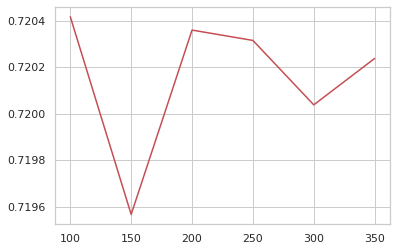

In [51]:
plt.plot(factor_values, mae_values, 'r-')
plt.show()

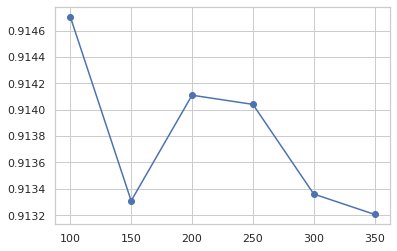

In [52]:
plt.plot(factor_values, rmse_values, 'bo-')
plt.show()

In [53]:
# Max Iterations
maxiters = [100, 150, 200, 250, 300, 350] # definir distintos numeros de factores
mae_values = [] # para almacenar resultados de MAP
rmse_values = [] # para almacenar valores de NDCG

for maxiter in maxiters:
  svd.train(factors=100, maxiter=maxiter, lr=0.01, lamb=0.1)
  
  predlist, mae, rmse = svd.test(input_file='u2.test',
                                 dlmchar=b'\t',
                                 header=False,
                                 usercol=0,
                                 itemcol=1,
                                 ratingcol=2)
  
  print(predlist)
  
  mae_values.append(mae)
  rmse_values.append(rmse)

[('1', '1', 3.799010329763081), ('1', '105', 2.524578285161192), ('1', '119', 4.378177197261417), ('1', '131', 3.9140594421073227), ('1', '133', 3.834379534616156), ('1', '135', 4.277087018083542), ('1', '136', 4.369186686324197), ('1', '138', 2.0253843225807255), ('1', '141', 3.6125585759632104), ('1', '144', 4.036737143456012), ('1', '146', 3.1779817200657132), ('1', '147', 3.022302310233546), ('1', '158', 2.184128176336497), ('1', '166', 4.46143193761869), ('1', '173', 4.409817383257588), ('1', '176', 4.142492615936722), ('1', '179', 4.240963920888547), ('1', '181', 4.264739990920321), ('1', '187', 4.184501413327588), ('1', '194', 4.1107166138177975), ('1', '197', 4.265087693571494), ('1', '2', 3.14998940546161), ('1', '205', 4.1408025676879054), ('1', '21', 2.7452463960448625), ('1', '211', 4.242364871437923), ('1', '22', 4.022737444411842), ('1', '220', 2.883760529741717), ('1', '234', 3.6109819968841004), ('1', '237', 3.6025835501612984), ('1', '239', 3.536093326562808), ('1', '2

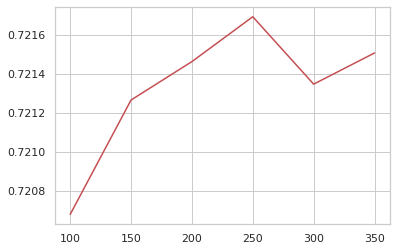

In [54]:
plt.plot(maxiters, mae_values, 'r-')
plt.show()

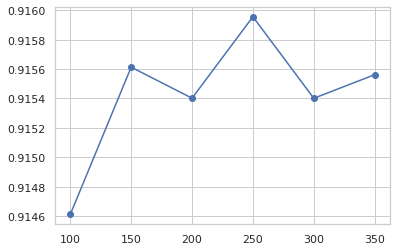

In [55]:
plt.plot(maxiters, rmse_values, 'bo-')
plt.show()

In [56]:
# Learning rate
learning_rates = [0.005, 0.01, 0.015, 0.02, 0.025, 0.03] # definir distintos numeros de factores
mae_values = [] # para almacenar resultados de MAP
rmse_values = [] # para almacenar valores de NDCG

for lr in learning_rates:
  svd.train(factors=100, maxiter=100, lr=lr, lamb=0.1)
  
  predlist, mae, rmse = svd.test(input_file='u2.test',
                                 dlmchar=b'\t',
                                 header=False,
                                 usercol=0,
                                 itemcol=1,
                                 ratingcol=2)
  
  print(predlist)

  mae_values.append(mae)
  rmse_values.append(rmse)

[('1', '1', 3.854448254294578), ('1', '105', 2.4711240454267607), ('1', '119', 4.316011796842713), ('1', '131', 3.73304459906842), ('1', '133', 3.7067251278723536), ('1', '135', 4.225326271082968), ('1', '136', 4.361870219960116), ('1', '138', 2.222076228953538), ('1', '141', 3.470684280048706), ('1', '144', 3.994468861451273), ('1', '146', 3.0345790665830017), ('1', '147', 3.231130701752401), ('1', '158', 2.247423297982646), ('1', '166', 4.390678371574957), ('1', '173', 4.546491927426562), ('1', '176', 4.128962761076296), ('1', '179', 4.2189383899517185), ('1', '181', 4.262122687824218), ('1', '187', 4.288269632544863), ('1', '194', 4.135091741323068), ('1', '197', 4.13155924868509), ('1', '2', 3.0826284066429777), ('1', '205', 4.011135922408939), ('1', '21', 2.638886534666559), ('1', '211', 4.186384893327778), ('1', '22', 4.050009253558835), ('1', '220', 3.0289150181573947), ('1', '234', 3.615709008296089), ('1', '237', 3.6110096144241677), ('1', '239', 3.6814287416155422), ('1', '24

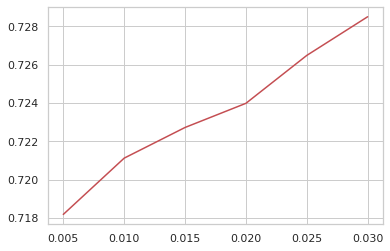

In [57]:
plt.plot(learning_rates, mae_values, 'r-')
plt.show()

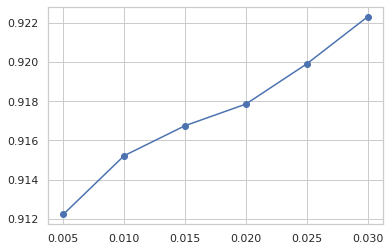

In [58]:
plt.plot(learning_rates, rmse_values, 'bo-')
plt.show()

In [59]:
# Lambda
lambdas = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3] # definir distintos numeros de factores
mae_values = [] # para almacenar resultados de MAP
rmse_values = [] # para almacenar valores de NDCG

for lamb in lambdas:
  svd.train(factors=100, maxiter=100, lr=0.01, lamb=lamb)
  
  predlist, mae, rmse = svd.test(input_file='u2.test',
                                 dlmchar=b'\t',
                                 header=False,
                                 usercol=0,
                                 itemcol=1,
                                 ratingcol=2)
  
  print(predlist)

  mae_values.append(mae)
  rmse_values.append(rmse)

[('1', '1', 4.232278223029363), ('1', '105', 2.870272911300251), ('1', '119', 4.455390441371339), ('1', '131', 3.9181318576481066), ('1', '133', 4.319355537368198), ('1', '135', 4.227213760180412), ('1', '136', 4.273863627957314), ('1', '138', 1.8591892042068432), ('1', '141', 3.7281280988603265), ('1', '144', 3.9270506593487298), ('1', '146', 3.174254262478689), ('1', '147', 3.221665630030254), ('1', '158', 2.1351742409286274), ('1', '166', 4.219428612948815), ('1', '173', 4.780994397290568), ('1', '176', 4.399174534091719), ('1', '179', 4.31665994707048), ('1', '181', 4.214682903675106), ('1', '187', 3.912960022702545), ('1', '194', 4.188458481609798), ('1', '197', 4.260308436666122), ('1', '2', 3.219095758330665), ('1', '205', 4.13764823850884), ('1', '21', 2.965787343053691), ('1', '211', 4.183525474320703), ('1', '22', 4.038951989809409), ('1', '220', 2.8544236283371918), ('1', '234', 3.5833306689571374), ('1', '237', 3.6425907848066803), ('1', '239', 3.57033793230017), ('1', '246

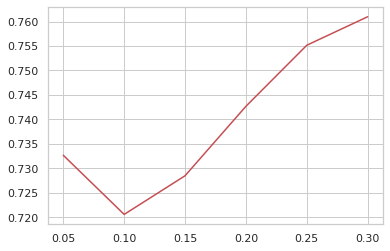

In [60]:
plt.plot(lambdas, mae_values, 'r-')
plt.show()

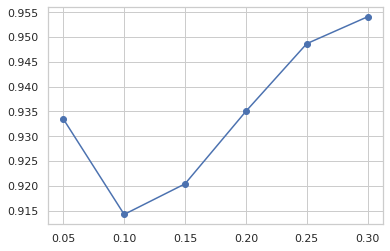

In [61]:
plt.plot(lambdas, rmse_values, 'bo-')
plt.show()

**Paso 7:** Genere un gráfico explorando todos los parámetros que ofrece el modelo `SVD`, donde se grafiquen los valores probados para cada parámetro y el RMSE obtenido para cada uno. Debe probar una cantidad razonable de valores buscando la mejor parametrización y entregar el notebook con dicha parametrización.



In [45]:
# Ejemplo
factor_values = [100, 150, 200, 250, 300, 350] # definir distintos numeros de factores
mae_values = [] # para almacenar resultados de MAP
rmse_values = [] # para almacenar valores de NDCG

for f in factor_values:
  svd.train(factors=f, maxiter=100, lr=0.01, lamb=0.1)
  
  predlist, mae, rmse = svd.test(input_file='u2.test',
                                 dlmchar=b'\t',
                                 header=False,
                                 usercol=0,
                                 itemcol=1,
                                 ratingcol=2)
  
  mae_values.append(mae)
  rmse_values.append(rmse)

print(mae_values)
print(rmse_values)

[0.7205731580459267, 0.7212553063390159, 0.719637232887809, 0.7200741845282824, 0.7201938871262948, 0.7203932942964257]
[0.9146631354790761, 0.9148521746728949, 0.9130365509092371, 0.913308147276502, 0.9130796218339372, 0.9132768629334815]


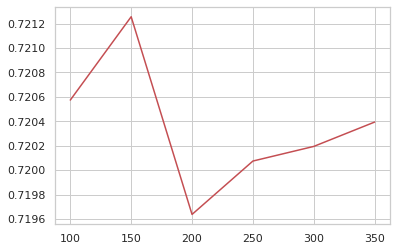

In [46]:
plt.plot(factor_values, mae_values, 'r-')
plt.show()

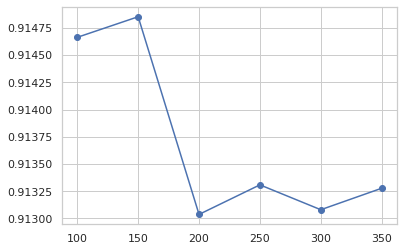

In [47]:
plt.plot(factor_values, rmse_values, 'bo-')
plt.show()

**Paso 8:** Pruebe con otros valores y/o parámetros: